In [ ]:
# @title Instalar librerias relacionadas al toolbox
!pip install tensorflow

In [4]:
# @title Importar Librerias
import sklearn as sk
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
# from tensorflow.examples.tutorials.mnist import input_data
from sklearn.manifold import LocallyLinearEmbedding
from sklearn.decomposition import PCA
from sklearn.decomposition import IncrementalPCA
from sklearn.decomposition import KernelPCA
from sklearn.decomposition import SparsePCA
from sklearn.manifold import MDS
from sklearn.manifold import Isomap
from sklearn.manifold import TSNE
from sklearn.decomposition import TruncatedSVD
from sklearn.random_projection import GaussianRandomProjection
from sklearn.decomposition import FastICA
from sklearn.decomposition import MiniBatchDictionaryLearning
from sklearn.random_projection import SparseRandomProjection
import keras
from keras.models import Sequential, Model
from keras.layers import Dense
from keras.optimizers import Adam

In [20]:
# tf.keras.datasets.mnist.load_data()[1][1].shape

(10000,)

In [21]:
# import tensorflow_datasets as tfds

In [22]:
# dataset = tfds.load(name="mnist", split=tfds.Split.TRAIN)

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset mnist downloaded and prepared to /root/tensorflow_datasets/mnist/3.0.1. Subsequent calls will reuse this data.


In [6]:
# import fashion MNIST
(train_images, train_labels), (test_images, test_labels) = tf.keras.datasets.fashion_mnist.load_data()

4422102/4422102 [==============================] - 1s 0us/step


In [49]:
train_images.reshape([60000, 784]).shape

(60000, 784)

In [32]:
# import tensorflow_datasets as datasets
# mnist = datasets.load(name='mnist')

In [45]:
# pd.read_csv('/content/sample_data/mnist_train_small.csv').shape

(19999, 785)

In [ ]:
# mnist = input_data.read_data_sets("MNIST_data/")
# mnist = tf.keras.datasets.mnist
# X_m = mnist.train.images
# y = mnist.train.labels

In [50]:
# mnist = input_data.read_data_sets("MNIST_data/")
X_m = train_images.reshape([60000, 784]) # mnist.train.images
y = train_labels # mnist.train.labels

Principal Composant Analysis

In [53]:
pca = PCA(n_components=784, whiten = False, random_state = 2019)
X_pca = pca.fit_transform(X_m)
X_pca_reconst = pca.inverse_transform(X_pca)

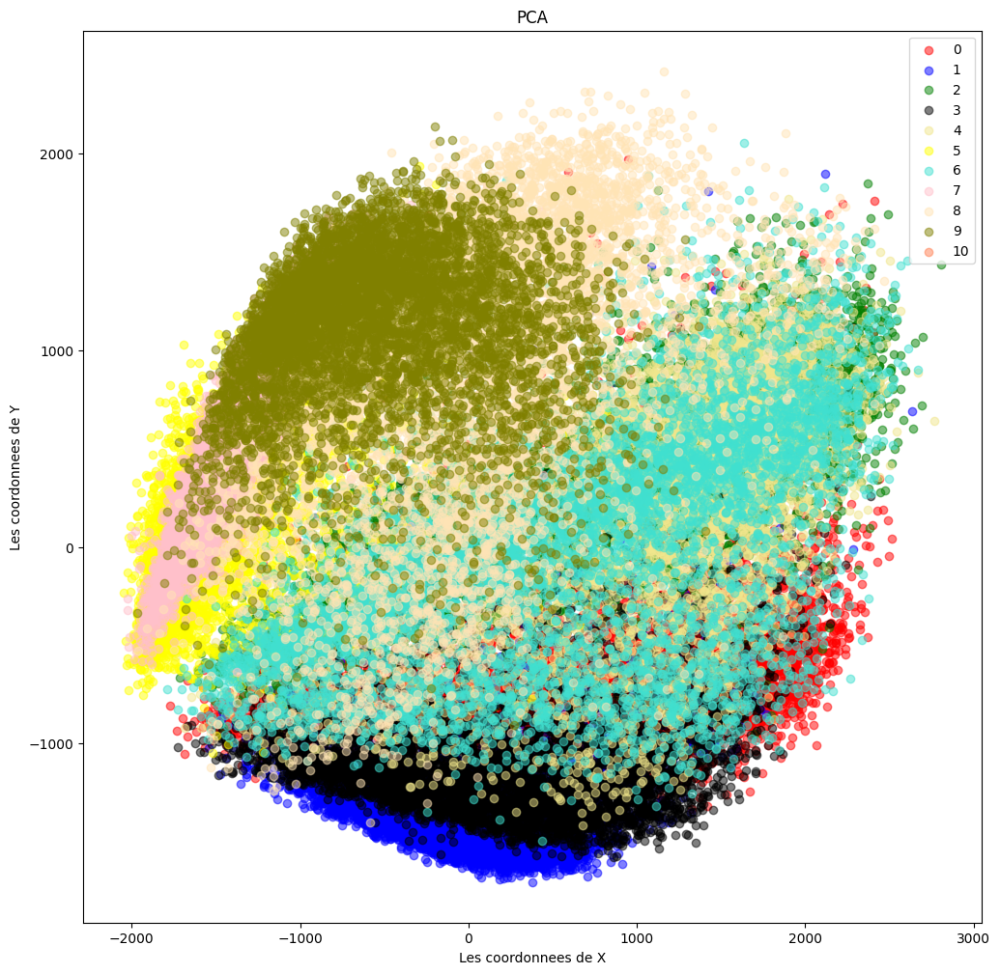

In [54]:
plt.figure(figsize=(12,12))

plt.scatter(X_pca[y==0, 0], X_pca[y==0, 1], color='red', alpha=0.5, label='0')
plt.scatter(X_pca[y==1, 0], X_pca[y==1, 1], color='blue', alpha=0.5, label='1')
plt.scatter(X_pca[y==2, 0], X_pca[y==2, 1], color='green', alpha=0.5, label='2')
plt.scatter(X_pca[y==3, 0], X_pca[y==3, 1], color='black', alpha=0.5, label='3')
plt.scatter(X_pca[y==4, 0], X_pca[y==4, 1], color='khaki', alpha=0.5, label='4')
plt.scatter(X_pca[y==5, 0], X_pca[y==5, 1], color='yellow', alpha=0.5, label='5')
plt.scatter(X_pca[y==6, 0], X_pca[y==6, 1], color='turquoise', alpha=0.5, label='6')
plt.scatter(X_pca[y==7, 0], X_pca[y==7, 1], color='pink', alpha=0.5, label='7')
plt.scatter(X_pca[y==8, 0], X_pca[y==8, 1], color='moccasin', alpha=0.5, label='8')
plt.scatter(X_pca[y==9, 0], X_pca[y==9, 1], color='olive', alpha=0.5, label='9')
plt.scatter(X_pca[y==10, 0], X_pca[y==10, 1], color='coral', alpha=0.5, label='10')
plt.title("PCA")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

Incremental PCA

In [55]:
n_batches = 256
inc_pca = IncrementalPCA(n_components=154)
for X_batch in np.array_split(X_m, n_batches):
  inc_pca.partial_fit(X_batch)
X_ipca = inc_pca.transform(X_m)
X_ipca_reconst = inc_pca.inverse_transform(X_ipca)

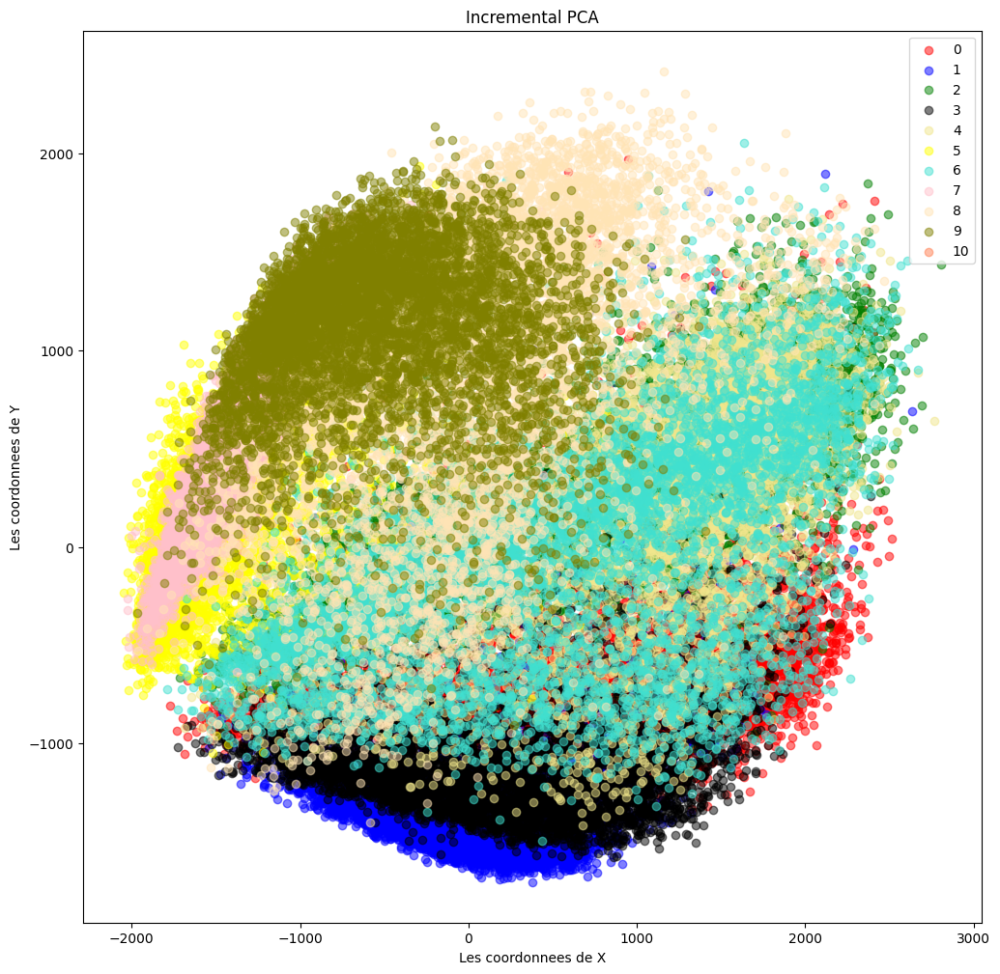

In [85]:
plt.figure(figsize=(12,12))

plt.scatter(X_ipca[y==0, 0], X_ipca[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_ipca[y==1, 0], X_ipca[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_ipca[y==2, 0], X_ipca[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_ipca[y==3, 0], X_ipca[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_ipca[y==4, 0], X_ipca[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_ipca[y==5, 0], X_ipca[y==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_ipca[y==6, 0], X_ipca[y==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_ipca[y==7, 0], X_ipca[y==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_ipca[y==8, 0], X_ipca[y==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_ipca[y==9, 0], X_ipca[y==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_ipca[y==10, 0], X_ipca[y==10, 1], color='coral', alpha=0.5,label='10')
plt.title("Incremental PCA")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

Kernel PCA

In [56]:
kpca = KernelPCA(kernel="rbf",n_components=154, gamma=None, fit_inverse_transform=True, random_state = 2019, n_jobs=1)
kpca.fit(X_m[:10000,:])
X_kpca = kpca.transform(X_m)
X_kpca_reconst = kpca.inverse_transform(X_kpca)

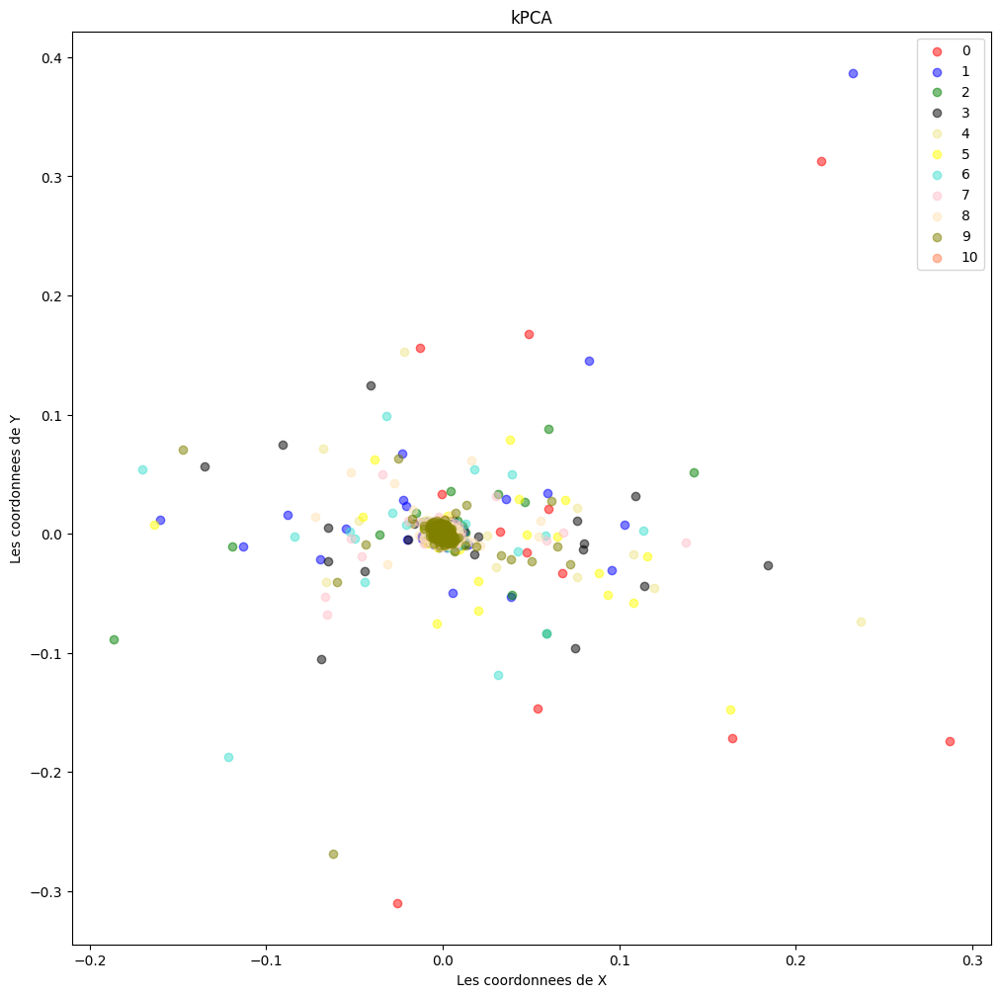

In [86]:
plt.figure(figsize=(12,12))

plt.scatter(X_kpca[y==0, 0], X_kpca[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_kpca[y==1, 0], X_kpca[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_kpca[y==2, 0], X_kpca[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_kpca[y==3, 0], X_kpca[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_kpca[y==4, 0], X_kpca[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_kpca[y==5, 0], X_kpca[y==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_kpca[y==6, 0], X_kpca[y==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_kpca[y==7, 0], X_kpca[y==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_kpca[y==8, 0], X_kpca[y==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_kpca[y==9, 0], X_kpca[y==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_kpca[y==10, 0], X_kpca[y==10, 1], color='coral', alpha=0.5,label='10')
plt.title("kPCA")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

Sparse PCA

In [57]:
sparsepca = SparsePCA(n_components=154, alpha=0.0001, random_state=2019, n_jobs=-1)
sparsepca.fit(X_m[:10000,:])
X_spacepca = sparsepca.transform(X_m)

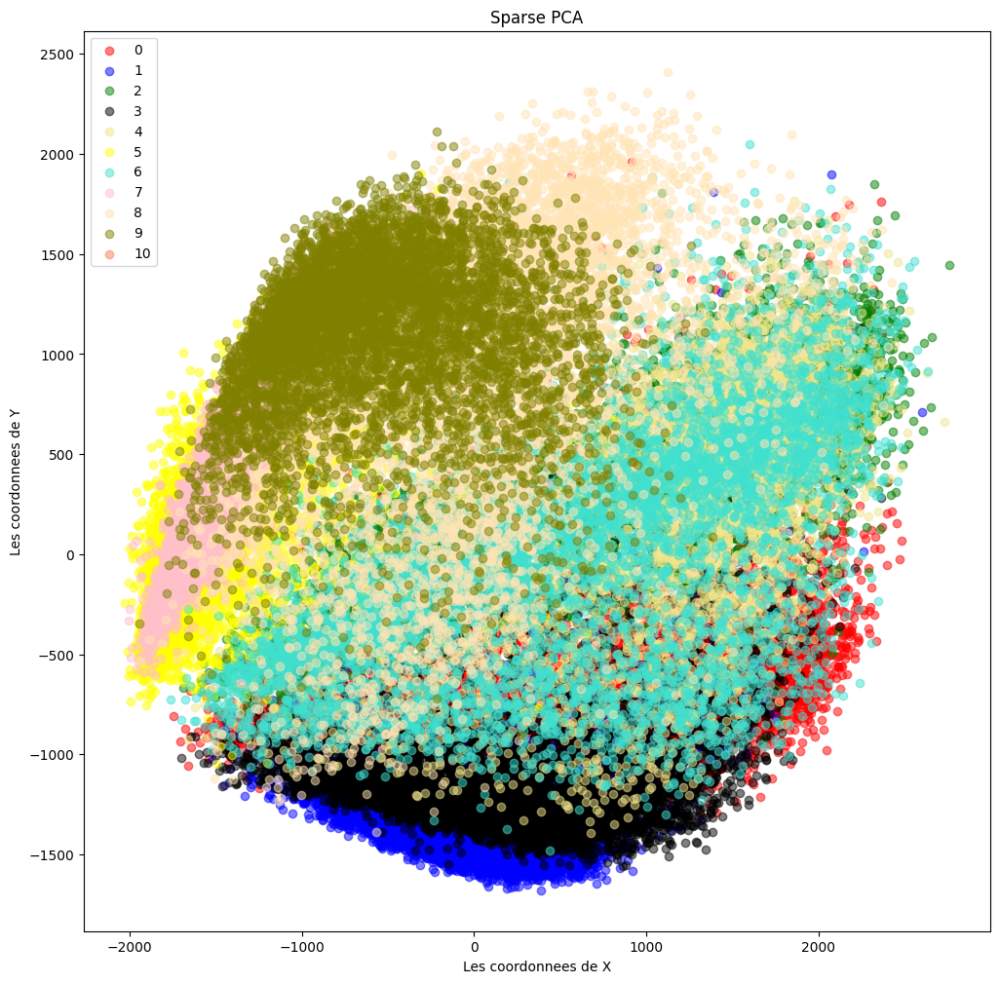

In [87]:
plt.figure(figsize=(12,12))

plt.scatter(X_spacepca[y==0, 0], X_spacepca[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_spacepca[y==1, 0], X_spacepca[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_spacepca[y==2, 0], X_spacepca[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_spacepca[y==3, 0], X_spacepca[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_spacepca[y==4, 0], X_spacepca[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_spacepca[y==5, 0], X_spacepca[y==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_spacepca[y==6, 0], X_spacepca[y==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_spacepca[y==7, 0], X_spacepca[y==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_spacepca[y==8, 0], X_spacepca[y==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_spacepca[y==9, 0], X_spacepca[y==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_spacepca[y==10, 0], X_spacepca[y==10, 1], color='coral', alpha=0.5,label='10')
plt.title("Sparse PCA")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

Singular Value Decomposition [SVD]

In [58]:
SVD_ = TruncatedSVD(n_components=154,algorithm='randomized', random_state=2019, n_iter=5)
SVD_.fit(X_m[:10000,:])
X_svd = SVD_.transform(X_m)
X_svd_reconst = SVD_.inverse_transform(X_svd)

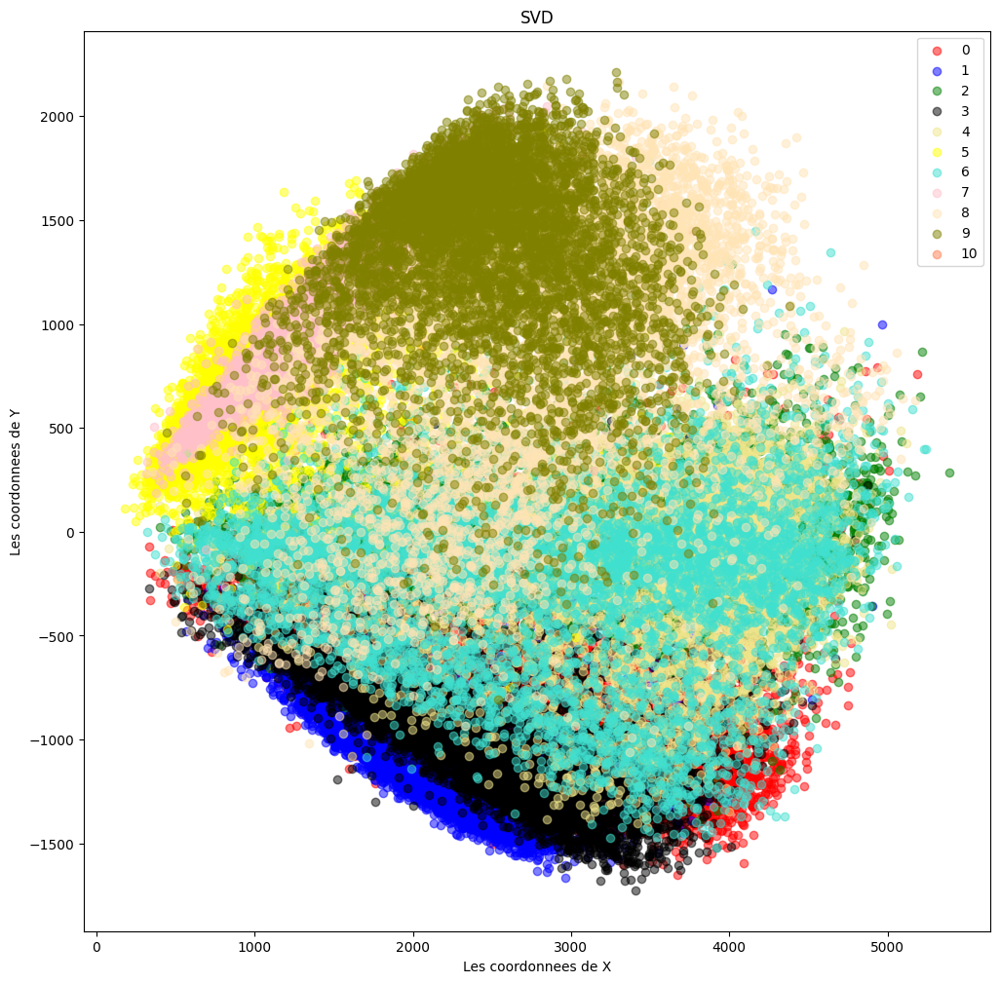

In [88]:
plt.figure(figsize=(12,12))

plt.scatter(X_svd[y==0, 0], X_svd[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_svd[y==1, 0], X_svd[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_svd[y==2, 0], X_svd[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_svd[y==3, 0], X_svd[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_svd[y==4, 0], X_svd[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_svd[y==5, 0], X_svd[y==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_svd[y==6, 0], X_svd[y==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_svd[y==7, 0], X_svd[y==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_svd[y==8, 0], X_svd[y==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_svd[y==9, 0], X_svd[y==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_svd[y==10, 0], X_svd[y==10, 1], color='coral', alpha=0.5,label='10')
plt.title("SVD")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

Gaussian Random Projection [GRP]

In [59]:
GRP = GaussianRandomProjection(n_components=154,eps = 0.5, random_state=2019)
GRP.fit(X_m[:10000,:])
X_grd = GRP.transform(X_m)

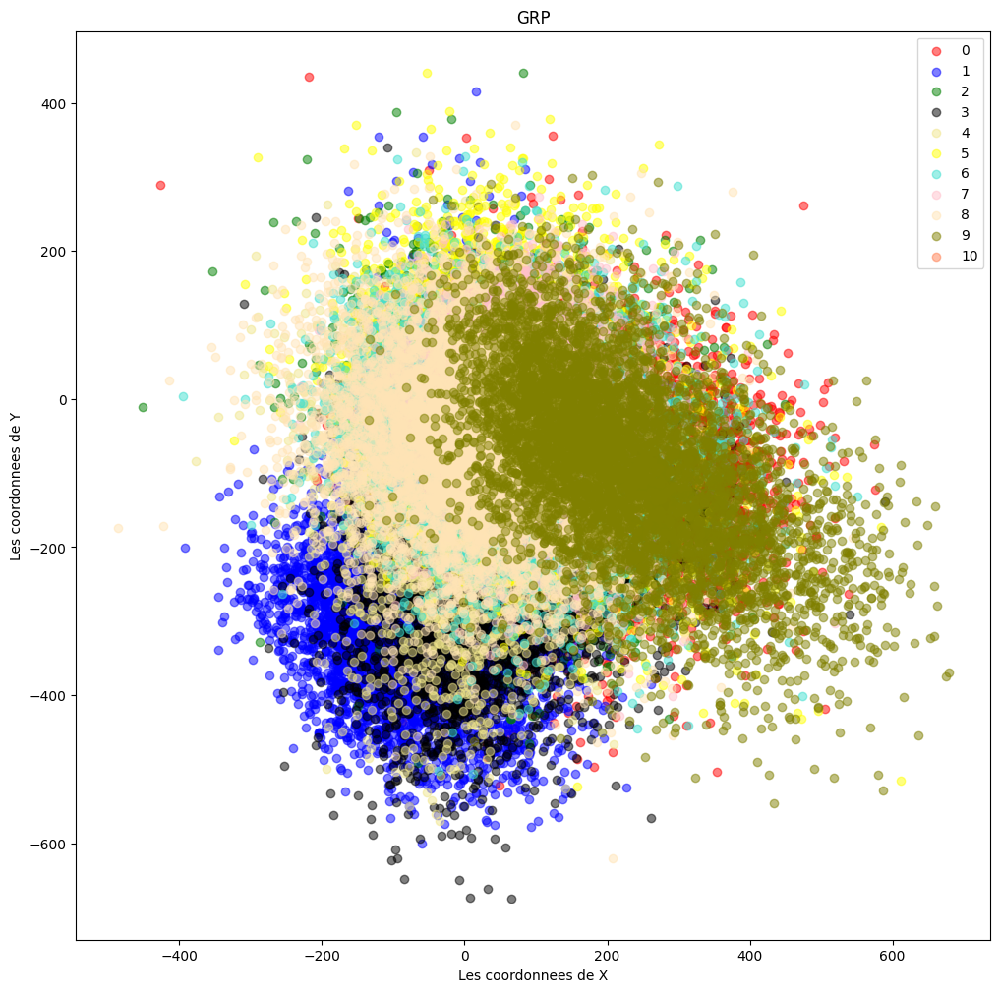

In [89]:
plt.figure(figsize=(12,12))

plt.scatter(X_grd[y==0, 0], X_grd[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_grd[y==1, 0], X_grd[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_grd[y==2, 0], X_grd[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_grd[y==3, 0], X_grd[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_grd[y==4, 0], X_grd[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_grd[y==5, 0], X_grd[y==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_grd[y==6, 0], X_grd[y==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_grd[y==7, 0], X_grd[y==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_grd[y==8, 0], X_grd[y==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_grd[y==9, 0], X_grd[y==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_grd[y==10, 0], X_grd[y==10, 1], color='coral', alpha=0.5,label='10')
plt.title("GRP")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

Sparse Random Projection [SRP]

In [60]:
SRP = SparseRandomProjection(n_components=154,density = 'auto', eps = 0.5, random_state=2019, dense_output = False)
SRP.fit(X_m[:10000,:])
X_srp = SRP.transform(X_m)

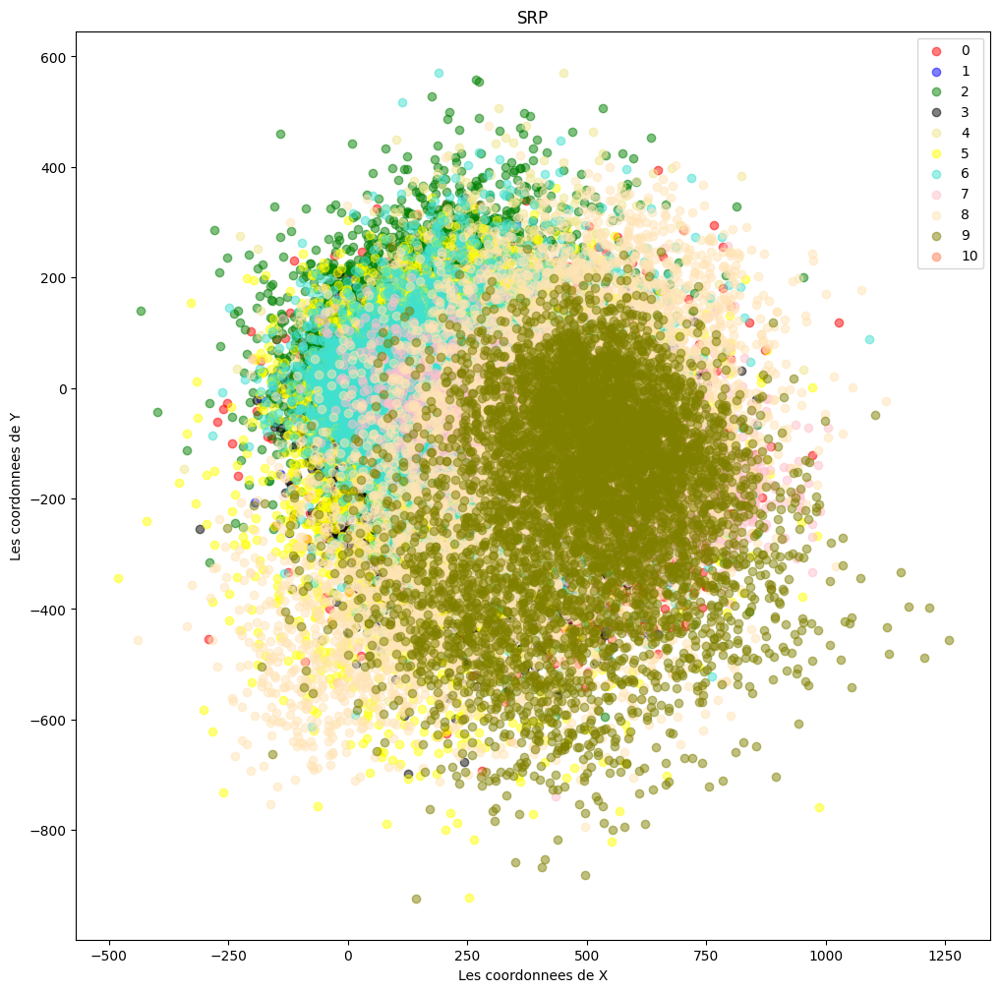

In [90]:
plt.figure(figsize=(12,12))

plt.scatter(X_srp[y==0, 0], X_srp[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_srp[y==1, 0], X_srp[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_srp[y==2, 0], X_srp[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_srp[y==3, 0], X_srp[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_srp[y==4, 0], X_srp[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_srp[y==5, 0], X_srp[y==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_srp[y==6, 0], X_srp[y==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_srp[y==7, 0], X_srp[y==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_srp[y==8, 0], X_srp[y==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_srp[y==9, 0], X_srp[y==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_srp[y==10, 0], X_srp[y==10, 1], color='coral', alpha=0.5,label='10')
plt.title("SRP")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

MultiDimensional Scaling [MDS]

In [61]:
mds = MDS(n_components=154, n_init=12, max_iter=1200, metric=True, n_jobs=4, random_state=2019)
X_mds = mds.fit_transform(X_m[:1000,:])

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


In [76]:
X_mds.shape

(1000, 154)

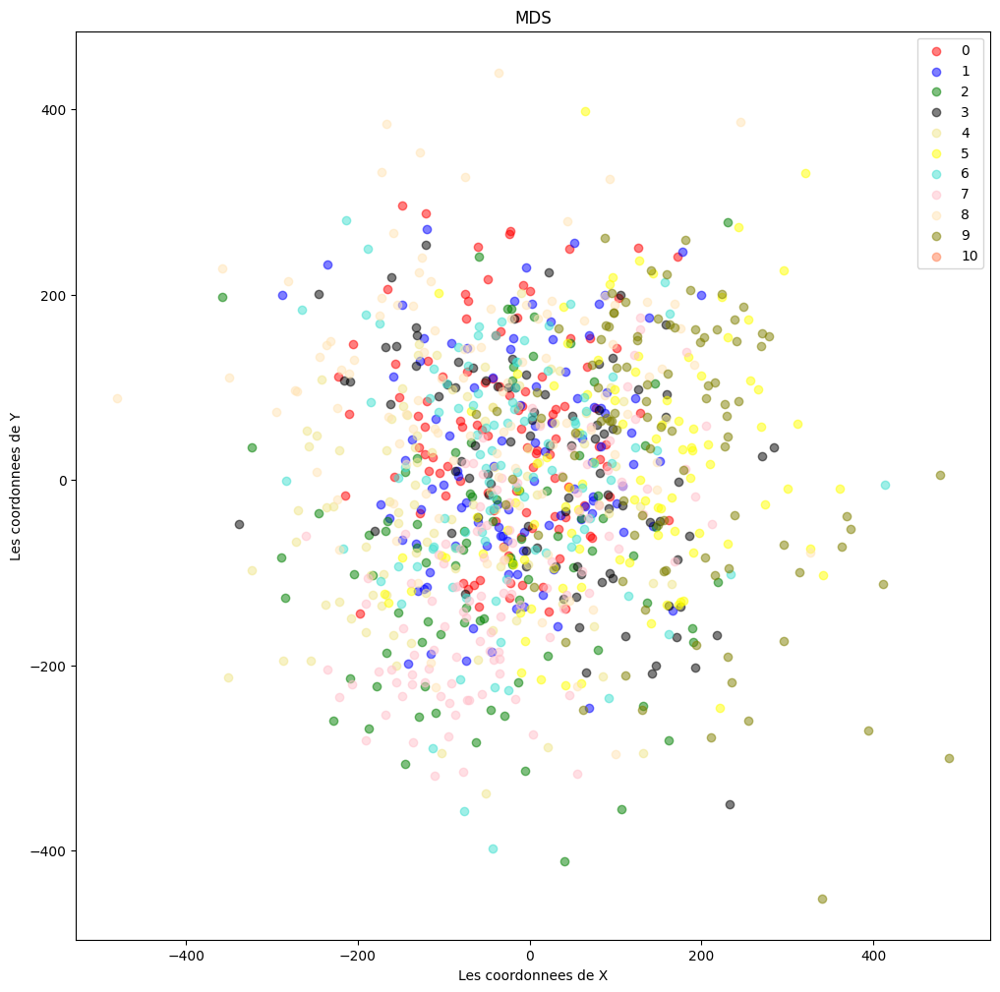

In [91]:
plt.figure(figsize=(12,12))
y_ = y[:1000].copy()
plt.scatter(X_mds[y_==0, 0], X_mds[y_==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_mds[y_==1, 0], X_mds[y_==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_mds[y_==2, 0], X_mds[y_==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_mds[y_==3, 0], X_mds[y_==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_mds[y_==4, 0], X_mds[y_==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_mds[y_==5, 0], X_mds[y_==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_mds[y_==6, 0], X_mds[y_==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_mds[y_==7, 0], X_mds[y_==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_mds[y_==8, 0], X_mds[y_==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_mds[y_==9, 0], X_mds[y_==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_mds[y_==10, 0], X_mds[y_==10, 1], color='coral', alpha=0.5,label='10')
plt.title("MDS")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

ISOMAP

In [62]:
isomap = Isomap(n_components=154, n_jobs = 4, n_neighbors = 5)
isomap.fit(X_m[0:5000,:])
X_isomap = isomap.transform(X_m)

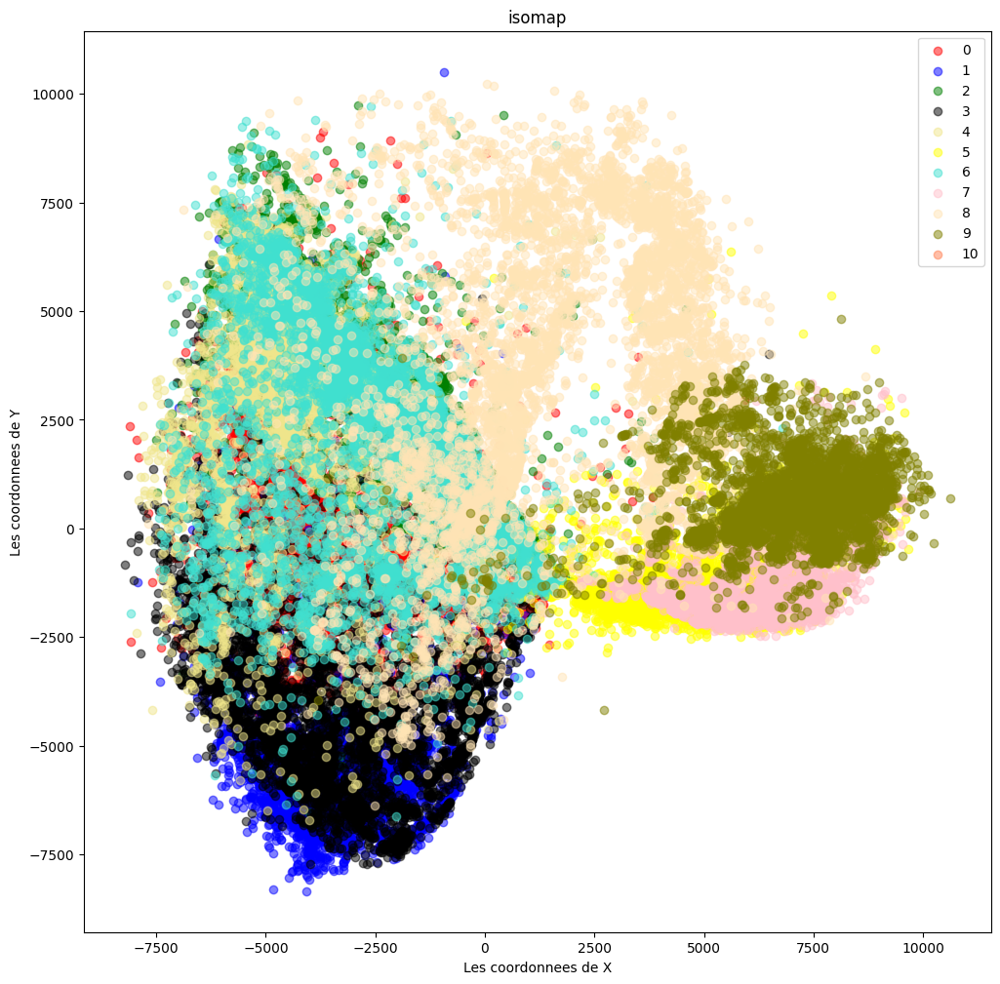

In [95]:
plt.figure(figsize=(12,12))

plt.scatter(X_isomap[y==0, 0], X_isomap[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_isomap[y==1, 0], X_isomap[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_isomap[y==2, 0], X_isomap[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_isomap[y==3, 0], X_isomap[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_isomap[y==4, 0], X_isomap[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_isomap[y==5, 0], X_isomap[y==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_isomap[y==6, 0], X_isomap[y==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_isomap[y==7, 0], X_isomap[y==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_isomap[y==8, 0], X_isomap[y==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_isomap[y==9, 0], X_isomap[y==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_isomap[y==10, 0], X_isomap[y==10, 1], color='coral', alpha=0.5,label='10')
plt.title("isomap")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

MiniBatch Dictionary Learning

In [63]:
miniBatchDictLearning = MiniBatchDictionaryLearning(n_components=154,batch_size = 200,alpha = 1,n_iter = 25,  random_state=2019)
miniBatchDictLearning.fit(X_m[:10000,:])
X_batch = miniBatchDictLearning.fit_transform(X_m)

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_dict_learning.py:2303: FutureWarning: 'n_iter' is deprecated in version 1.1 and will be removed in version 1.4. Use 'max_iter' and let 'n_iter' to its default value instead. 'n_iter' is also ignored if 'max_iter' is specified.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_dict_learning.py:2303: FutureWarning: 'n_iter' is deprecated in version 1.1 and will be removed in version 1.4. Use 'max_iter' and let 'n_iter' to its default value instead. 'n_iter' is also ignored if 'max_iter' is specified.
  warnings.warn(


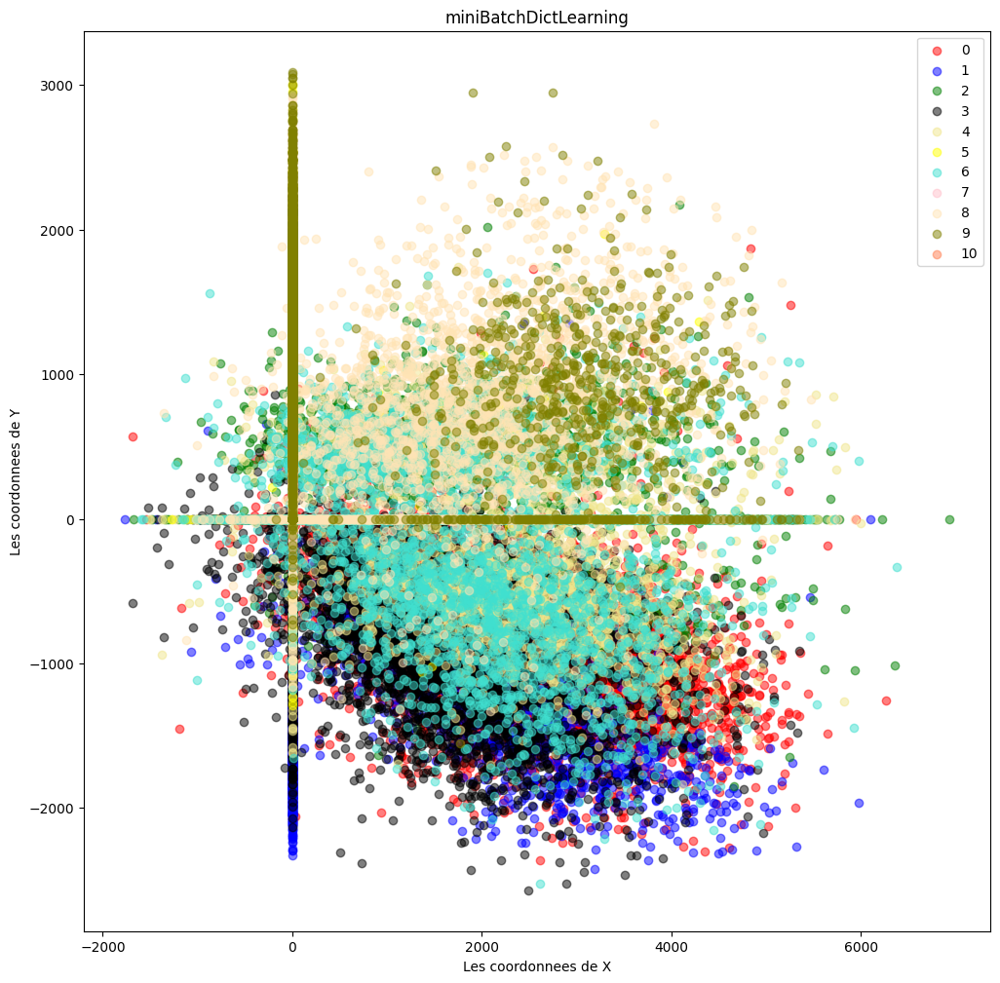

In [99]:
plt.figure(figsize=(12,12))

plt.scatter(X_batch[y==0, 0], X_batch[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_batch[y==1, 0], X_batch[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_batch[y==2, 0], X_batch[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_batch[y==3, 0], X_batch[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_batch[y==4, 0], X_batch[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_batch[y==5, 0], X_batch[y==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_batch[y==6, 0], X_batch[y==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_batch[y==7, 0], X_batch[y==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_batch[y==8, 0], X_batch[y==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_batch[y==9, 0], X_batch[y==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_batch[y==10, 0], X_batch[y==10, 1], color='coral', alpha=0.5,label='10')
plt.title("miniBatchDictLearning")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

Independent Composent Analysis [ICA]

In [64]:
FastICA = FastICA(n_components=154, algorithm = 'parallel',whiten = True,max_iter = 100,  random_state=2019)
X_fica = FastICA.fit_transform(X_m)
X_fica_reconst = FastICA.inverse_transform(X_fica)

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:708: FutureWarning: Starting in v1.3, whiten=True should be specified as whiten='arbitrary-variance' (its current behaviour). This behavior is deprecated in 1.1 and will raise ValueError in 1.3.
  return self._fit_transform(X, compute_sources=True)


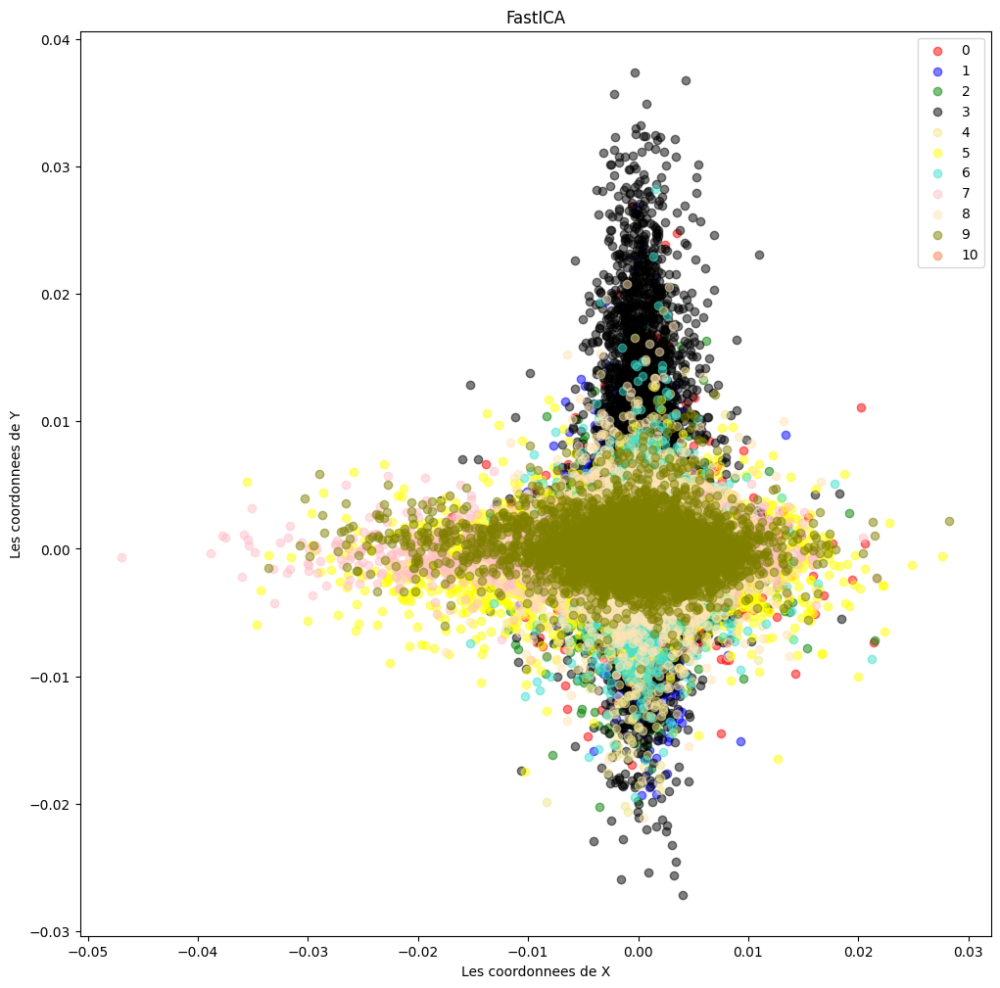

In [98]:
plt.figure(figsize=(12,12))

plt.scatter(X_fica[y==0, 0], X_fica[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_fica[y==1, 0], X_fica[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_fica[y==2, 0], X_fica[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_fica[y==3, 0], X_fica[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_fica[y==4, 0], X_fica[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_fica[y==5, 0], X_fica[y==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_fica[y==6, 0], X_fica[y==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_fica[y==7, 0], X_fica[y==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_fica[y==8, 0], X_fica[y==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_fica[y==9, 0], X_fica[y==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_fica[y==10, 0], X_fica[y==10, 1], color='coral', alpha=0.5,label='10')
plt.title("FastICA")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

T-distributed Stochastic Neighbor Embedding [T-SNE]

In [65]:
tsne = TSNE(n_components=2,learning_rate=300,perplexity = 30,early_exaggeration = 12,init = 'random',  random_state=2019)
X_tsne = tsne.fit_transform(X_m[:10000,:])

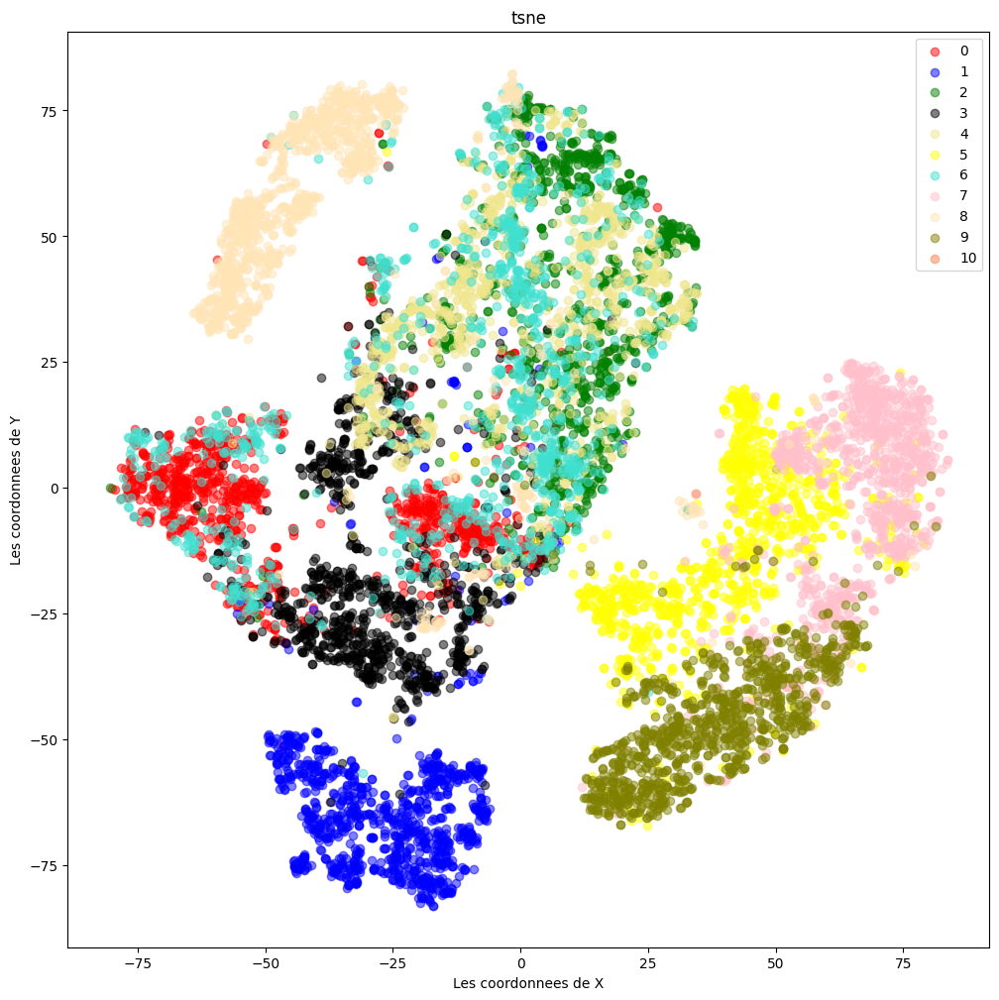

In [102]:
plt.figure(figsize=(12,12))
y_=y[:10000].copy()
plt.scatter(X_tsne[y_==0, 0], X_tsne[y_==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_tsne[y_==1, 0], X_tsne[y_==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_tsne[y_==2, 0], X_tsne[y_==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_tsne[y_==3, 0], X_tsne[y_==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_tsne[y_==4, 0], X_tsne[y_==4, 1], color='khaki', alpha=0.5,label='4')
plt.scatter(X_tsne[y_==5, 0], X_tsne[y_==5, 1], color='yellow', alpha=0.5,label='5')
plt.scatter(X_tsne[y_==6, 0], X_tsne[y_==6, 1], color='turquoise', alpha=0.5,label='6')
plt.scatter(X_tsne[y_==7, 0], X_tsne[y_==7, 1], color='pink', alpha=0.5,label='7')
plt.scatter(X_tsne[y_==8, 0], X_tsne[y_==8, 1], color='moccasin', alpha=0.5,label='8')
plt.scatter(X_tsne[y_==9, 0], X_tsne[y_==9, 1], color='olive', alpha=0.5,label='9')
plt.scatter(X_tsne[y_==10, 0], X_tsne[y_==10, 1], color='coral', alpha=0.5,label='10')
plt.title("tsne")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

Locally Linear Embedding [LLE]

In [66]:
lle = LocallyLinearEmbedding(n_components=4, n_neighbors = 10,method = 'modified', n_jobs = 4,  random_state=2019)
lle.fit(X_m[:5000,:])
X_lle = lle.transform(X_m)

In [105]:
X_lle.shape

(60000, 4)

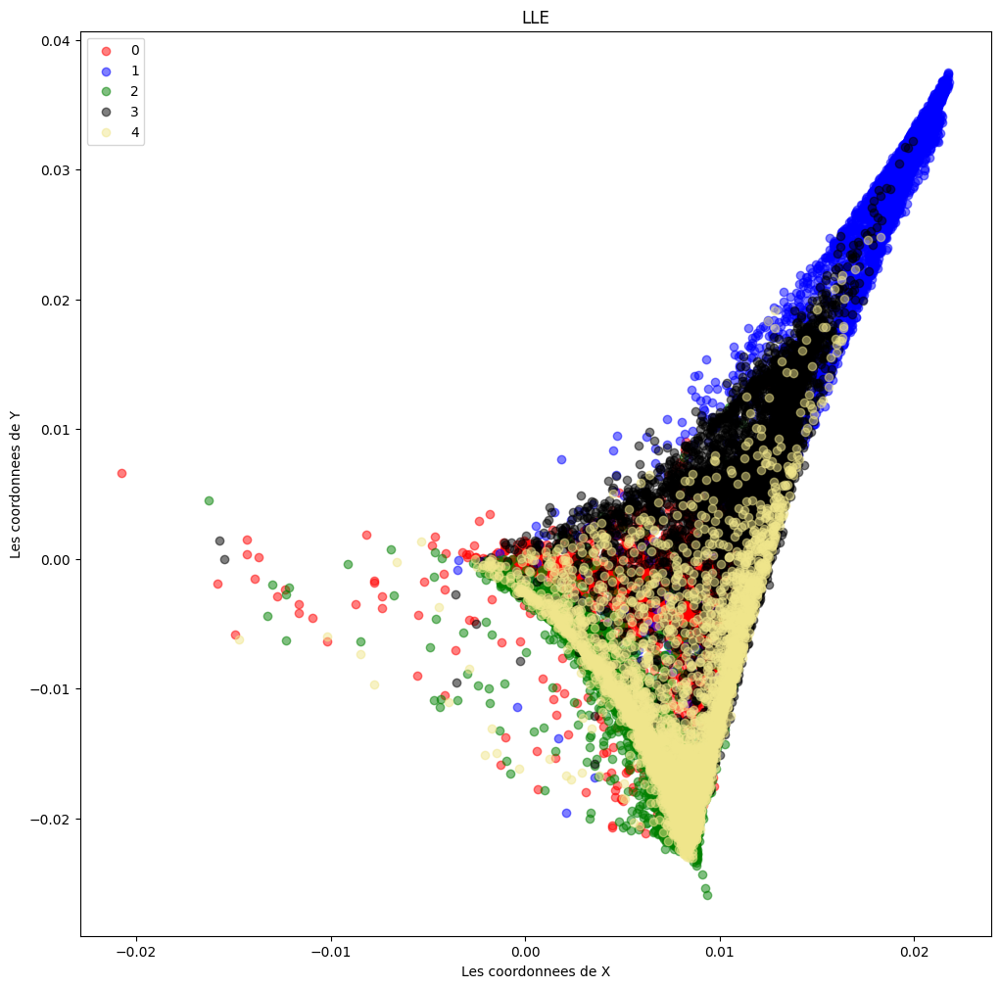

In [108]:
plt.figure(figsize=(12,12))

plt.scatter(X_lle[y==0, 0], X_lle[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(X_lle[y==1, 0], X_lle[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(X_lle[y==2, 0], X_lle[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(X_lle[y==3, 0], X_lle[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(X_lle[y==4, 0], X_lle[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.title("LLE")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

Autoencoders

In [67]:
m = Sequential()
m.add(Dense(512,  activation='elu', input_shape=(784,)))
m.add(Dense(128,  activation='elu'))
m.add(Dense(2,    activation='linear', name="bottleneck"))
m.add(Dense(128,  activation='elu'))
m.add(Dense(512,  activation='elu'))
m.add(Dense(784,  activation='sigmoid'))
m.compile(loss='mean_squared_error', optimizer = Adam())
history = m.fit(X_m, X_m, batch_size=128, epochs=5, verbose=1)

encoder = Model(m.input, m.get_layer('bottleneck').output)
Zenc = encoder.predict(X_m)
Renc = m.predict(X_m)

Epoch 1/5
469/469 [==============================] - 12s 23ms/step - loss: 13281.0254
Epoch 2/5
469/469 [==============================] - 14s 31ms/step - loss: 13280.2979
Epoch 3/5
469/469 [==============================] - 10s 21ms/step - loss: 13280.3037
Epoch 4/5
469/469 [==============================] - 11s 23ms/step - loss: 13280.3018
Epoch 5/5
1875/1875 [==============================] - 10s 5ms/step


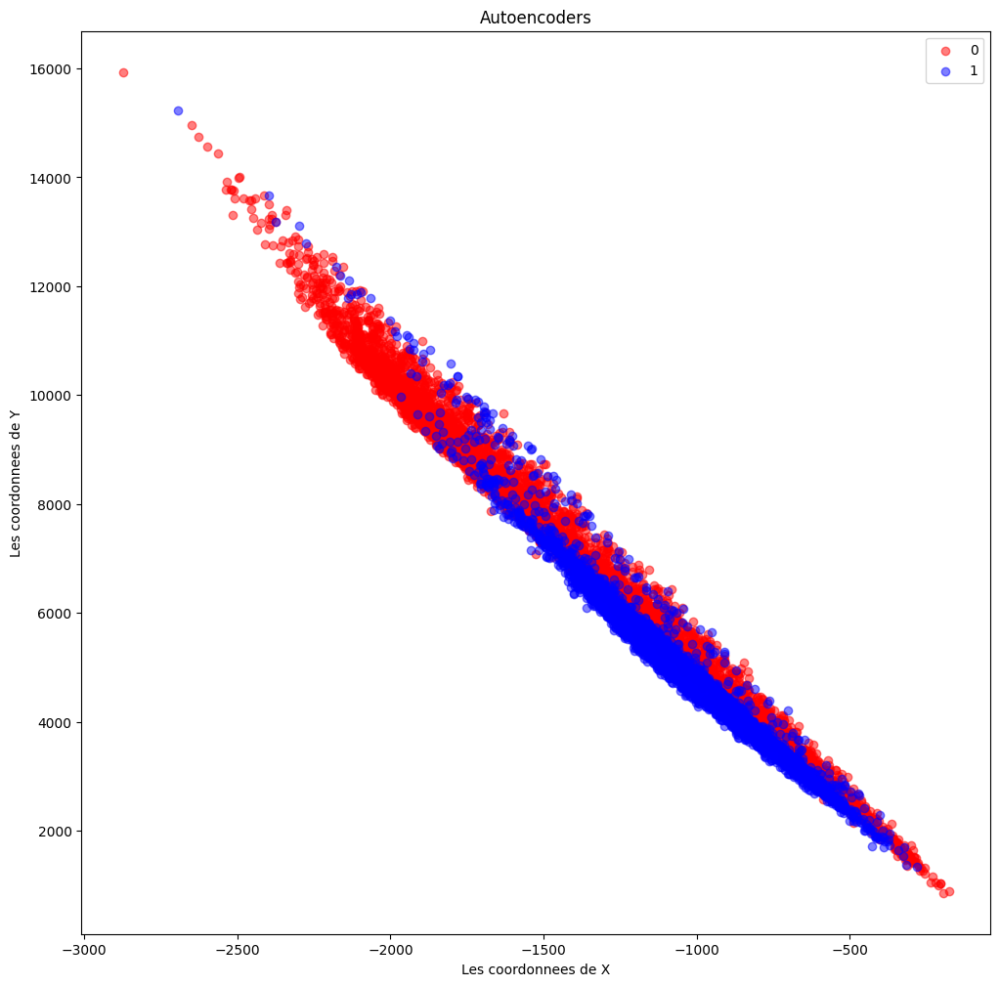

In [111]:
plt.figure(figsize=(12,12))

plt.scatter(Zenc[y==0, 0], Zenc[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(Zenc[y==1, 0], Zenc[y==1, 1], color='blue', alpha=0.5,label='1')
plt.title("Autoencoders")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()

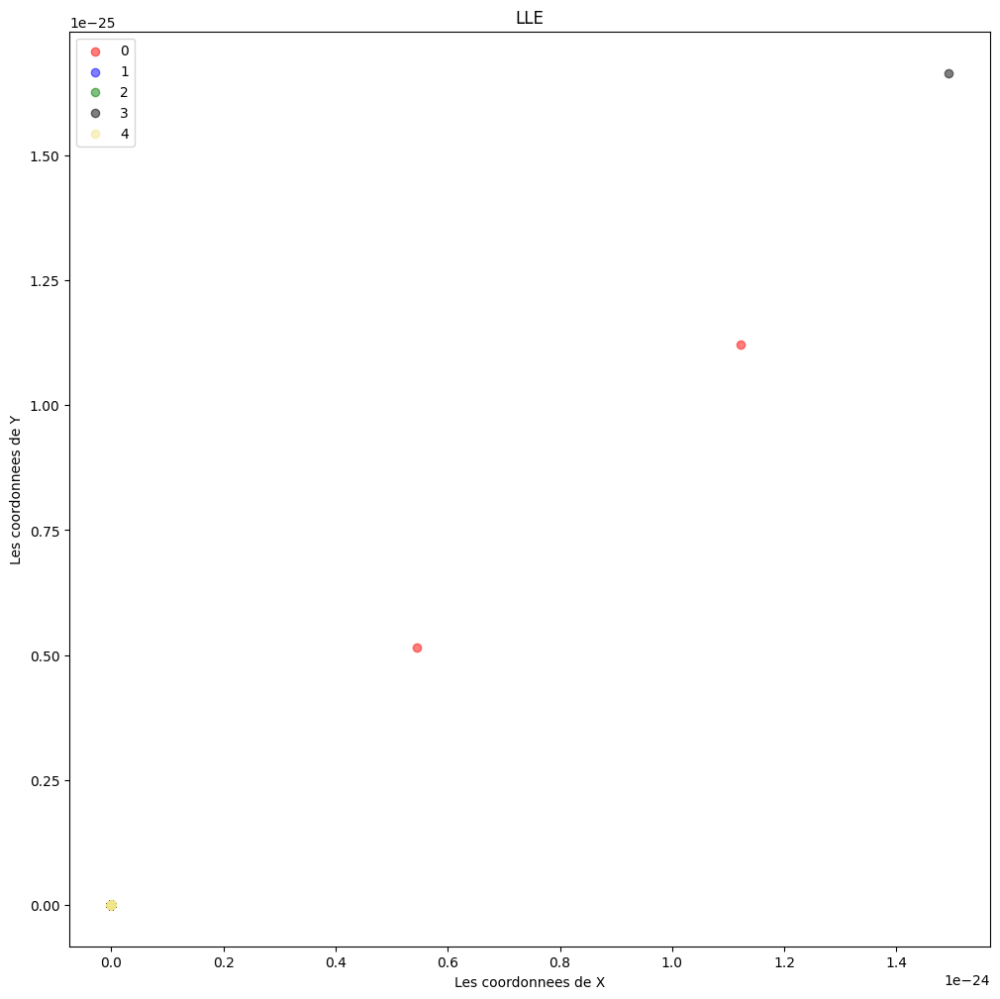

In [112]:
plt.figure(figsize=(12,12))

plt.scatter(Renc[y==0, 0], Renc[y==0, 1], color='red', alpha=0.5,label='0')
plt.scatter(Renc[y==1, 0], Renc[y==1, 1], color='blue', alpha=0.5,label='1')
plt.scatter(Renc[y==2, 0], Renc[y==2, 1], color='green', alpha=0.5,label='2')
plt.scatter(Renc[y==3, 0], Renc[y==3, 1], color='black', alpha=0.5,label='3')
plt.scatter(Renc[y==4, 0], Renc[y==4, 1], color='khaki', alpha=0.5,label='4')
plt.title("LLE")
plt.ylabel('Les coordonnees de Y')
plt.xlabel('Les coordonnees de X')
plt.legend()
plt.show()